In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import plotly
from skimage import io
from skimage import morphology as morp
import plotly.express as px
import plotly.graph_objects as go

In [0]:
path = '/content/drive/My Drive/Image Processing/'

(512, 512, 3)


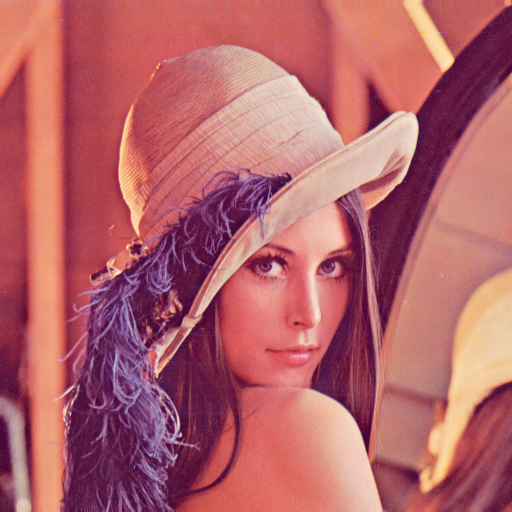

In [18]:
I = cv2.imread(path + 'lena.png')
print (I.shape)
cv2_imshow(I)

# print (I[0:2][0:1])

(137, 137, 4)


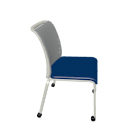

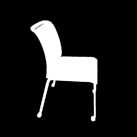

In [25]:
I = cv2.imread(path + 'chair.png',  cv2.IMREAD_UNCHANGED)
print (I.shape)
cv2_imshow(I)
I.shape[2]==4
# print (I[::3])
cv2_imshow(I[:,:,3])

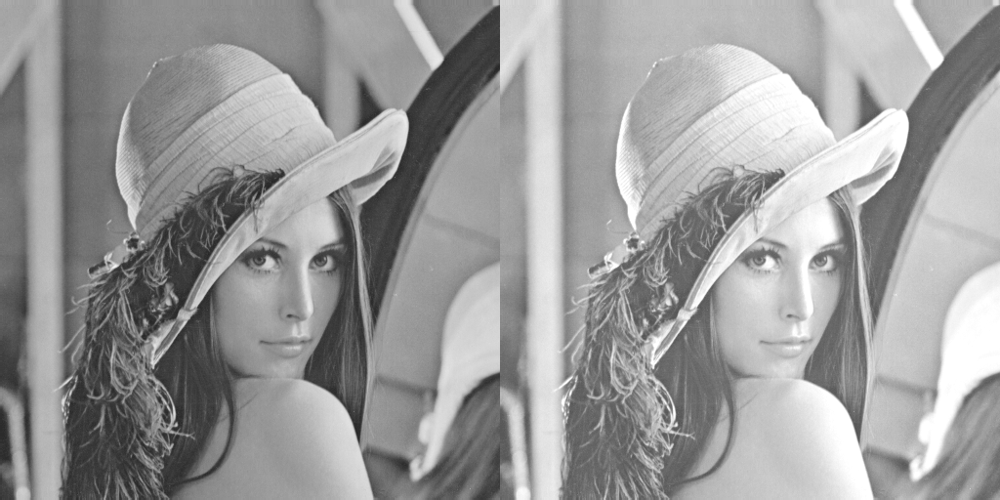

In [30]:
linear_shift = 45
I_lena_bw = cv2.imread(path + 'lena.png', cv2.IMREAD_GRAYSCALE)
I = I_lena_bw.astype('int')
lena_shifted = np.clip((I + linear_shift),0,255).astype('uint8')
cv2_imshow(np.hstack([I, lena_shifted]))
# Plotting the Histogram
fig = go.Figure()
fig.add_trace(go.Histogram(x=I.ravel(), name= 'Original Image'))
fig.add_trace(go.Histogram(x=lena_shifted.ravel(), name= 'Correct Transformation'))
fig.show()

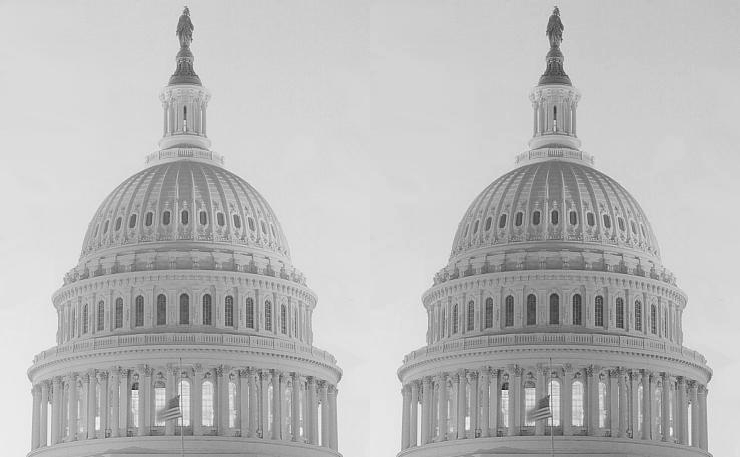

In [92]:
c=1
e=1.2
I_lena_bw = cv2.imread(path + 'gamma1.jpg', cv2.IMREAD_GRAYSCALE)
I = I_lena_bw.astype('int')
gammal = np.clip(((255)*np.power(I/255,e)),0,255).astype('uint8')

cv2_imshow(np.hstack([I,gammal]))


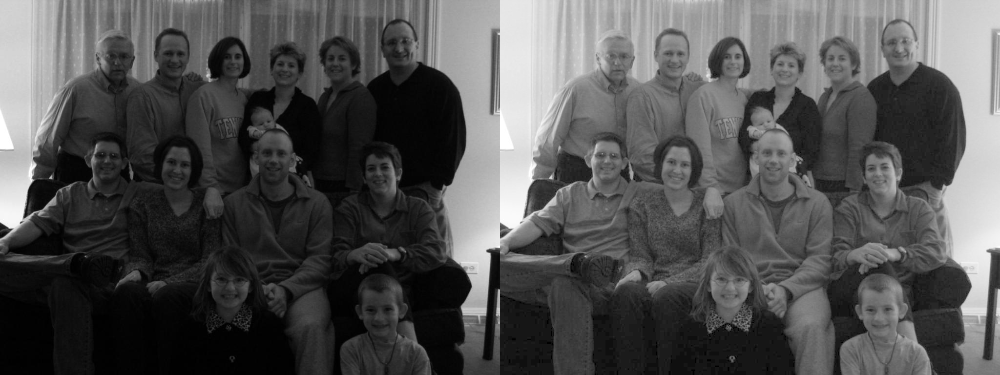

In [97]:
c=1
e=0.5

I_lena_bw = cv2.imread(path + 'gamma2.jpg', cv2.IMREAD_GRAYSCALE)
I = I_lena_bw.astype('int')
gammal = np.clip(((255)*np.power(I/255,e)),0,255).astype('uint8')

cv2_imshow(np.hstack([I,gammal]))
fig = go.Figure()
fig.add_trace(go.Histogram(x=I.ravel()))
fig.add_trace(go.Histogram(x=gammal.ravel()))


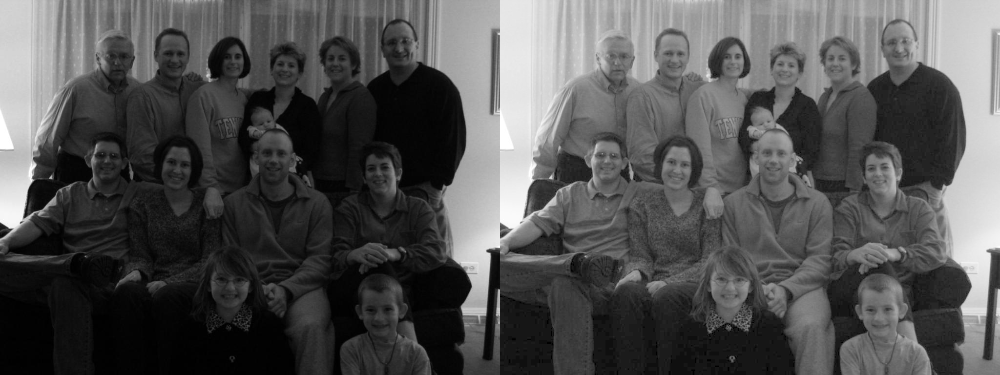

AttributeError: ignored

In [127]:
t=55

I_lena_bw = cv2.imread(path + 'gamma2.jpg', cv2.IMREAD_GRAYSCALE)
I = I_lena_bw.astype('int')
ret,gamma1 = cv2.threshold(I_lena_bw,t,255,cv2.THRESH_BINARY)

cv2_imshow(np.hstack([I,gammal]))
fig = go.Figure()
fig.add_trace(go.Histogram(x=I.ravel()))
fig.add_trace(go.Histogram(x=gammal.ravel()))
fig.show()


In [11]:
I = cv2.imread(path + 'lotus.jpg')
# cv2_imshow(np.hstack([I,gammal]))

fig = go.Figure()
fig.add_trace(go.Histogram(x=I[:,:,2].ravel()))
fig.add_trace(go.Histogram(x=I[:,:1].ravel()))
fig.add_trace(go.Histogram(x=I[:,:,0].ravel()))
# fig.show()


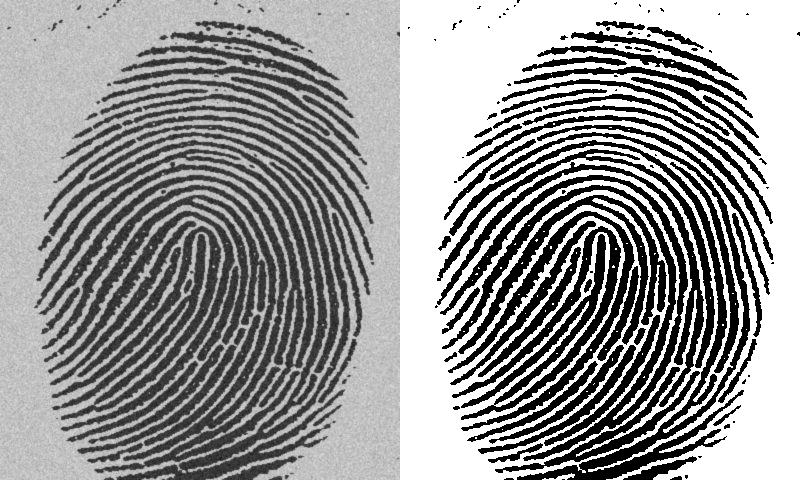

In [17]:
I = io.imread(path + "FingerPrint.jpg", cv2.IMREAD_GRAYSCALE)

th = 100
T = I.copy()
T[T <= th] = 0
T[T > th] = 255
cv2_imshow(np.hstack([I,T]))


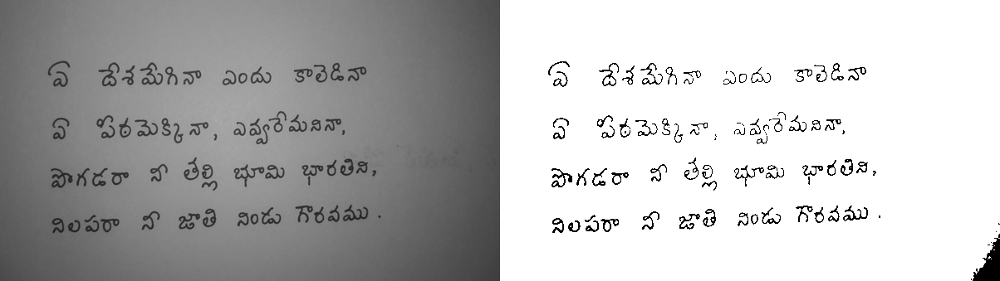

In [37]:
I = cv2.imread(path + 'text.jpg', cv2.IMREAD_GRAYSCALE)
I = I.astype('int')
th = 70
T = I.copy()
T[T <= th] = 0
T[T > th] = 255
cv2_imshow(np.hstack([I,T]))


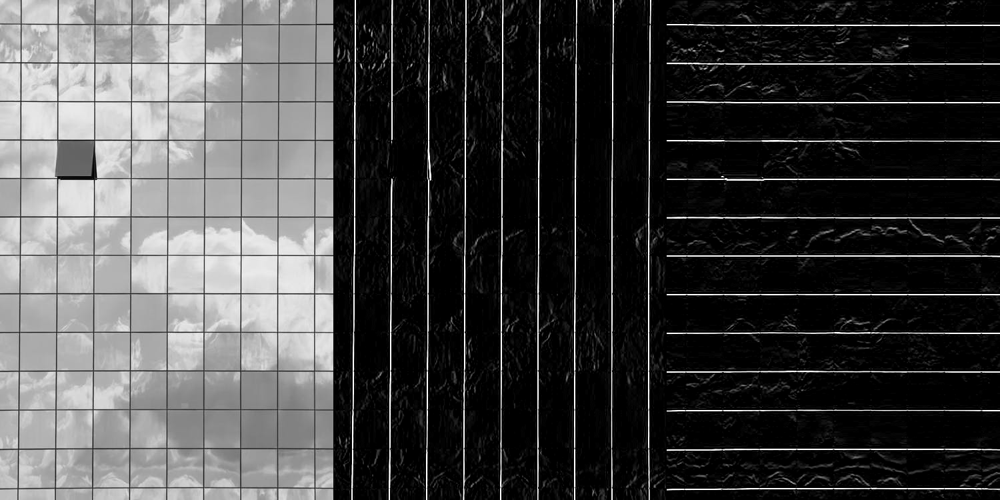

13 9 140


In [57]:


I = cv2.imread(path+'window.jpeg', cv2.IMREAD_GRAYSCALE)

sobelX = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
I1 = cv2.filter2D(I,-1,sobelX)

sobelY = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
I2 = cv2.filter2D(I,-1,sobelY)
cv2_imshow(np.hstack([I,I1,I2]))
prev = 0
t=150
ver = 0
I1 = np.sum(I1,0)/I1.shape[1]
I2 = np.sum(I2,1)/I2.shape[0]
for x in I1:
  if prev == 0 and  x > t:
    ver = ver+1
    prev = 1
  elif  x < t:
    prev =0
prev = 0
hor = 0
for x in I2:
  if prev == 0 and  x > t:
    hor = hor+1
    prev = 1
  elif  x < t:
    prev =0
print(hor,ver,(hor+1)*(ver+1))